In [1]:
import os
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA_VISIBLE_DEVICES'] = '4'

In [2]:
import numpy as np
import pandas as pd

# import tqdm.notebook as tq
import tqdm as tq

import random

import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader

from sklearn.preprocessing import OneHotEncoder

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 10]

In [3]:
random_seed = 13

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

In [4]:
dataset = 'ElectricDevices'

from sktime.datasets import load_UCR_UEA_dataset

X_train, y_train = load_UCR_UEA_dataset(name=dataset, split='train', return_type='numpyflat')
X_test, y_test = load_UCR_UEA_dataset(name=dataset, split='test', return_type='numpyflat')

In [5]:
print(f'Length training data: {len(X_train)} labels: {len(y_train)} test data: {len(X_test)} labels: {len(y_test)}')

Length training data: 8926 labels: 8926 test data: 7711 labels: 7711


In [6]:
encoder = OneHotEncoder(categories='auto', sparse_output=False)

y_train_ohe = encoder.fit_transform(np.expand_dims(y_train, axis=-1))
y_test_ohe = encoder.transform(np.expand_dims(y_test, axis=-1))

y_train_norm = y_train_ohe.argmax(axis=-1)
y_test_norm = y_test_ohe.argmax(axis=-1)

In [7]:
class FordADataset(Dataset):

    def __init__(self, X, y):
        self.X = X
        self.y = y
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        inputs = self.X[idx]
        label = self.y[idx]
        
        return inputs, label

In [8]:
dataset_train = FordADataset(X_train, y_train_ohe)
dataset_test = FordADataset(X_test, y_test_ohe)

In [9]:
dataloader_train = DataLoader(dataset_train, batch_size=120, shuffle=True)
dataloader_train_not_shuffled = DataLoader(dataset_train, batch_size=120, shuffle=False)
dataloader_test = DataLoader(dataset_test, batch_size=120, shuffle=False)

In [10]:
class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv1d(1, 10, kernel_size=3, stride=1),
            nn.BatchNorm1d(10),
            nn.ReLU(inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv1d(10, 50, kernel_size=3, stride=1),
            nn.BatchNorm1d(50),
            nn.ReLU(inplace=True)
        )
        self.conv3 = nn.Sequential(
            nn.Conv1d(50, 50, kernel_size=3, stride=1),
            nn.BatchNorm1d(50),
            nn.MaxPool1d(3),
            nn.ReLU(inplace=True)
        )
        
        self.fc1 = nn.Sequential(
            nn.Linear(50 * 30, 50),
            nn.Dropout(0.5),
            nn.ReLU(inplace=True)
        )
        self.fc2 = nn.Sequential(
            nn.Linear(50, 7),
            nn.Softmax(-1)
        )
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        batch_size = x.shape[0]
        x = x.view(batch_size, -1)
        x = self.fc1(x)
        x = self.fc2(x)
        
        return x

# Training of the model

In [11]:
def trainer(model, dataloader_train, criterion):
    running_loss = 0

    model.train()

    for idx, (inputs, labels) in enumerate(dataloader_train):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        optimizer.zero_grad()
        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss


def validator(model, dataloader_test, criterion):
    running_loss = 0

    model.eval()

    for idx, (inputs, labels) in enumerate(dataloader_test):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss

In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNN().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
loss = nn.CrossEntropyLoss()

In [13]:
epochs = 500

for epoch in range(epochs):
    train_loss = trainer(model, dataloader_train, loss)
    if epoch % 10 == 0:
        print(f'Val {validator(model, dataloader_test, loss):}')
        print('Train', train_loss)

Val 1.446653634707133
Train 1.7714177211125692
Val 1.295879095395406
Train 1.4276316897074381
Val 1.3065350643793743
Train 1.3753177706400554
Val 1.2940439987182617
Train 1.3404249636332195
Val 1.2926114304860432
Train 1.312983741760254
Val 1.2734443775812785
Train 1.2953631416956584
Val 1.2729761139551798
Train 1.2823548078536988
Val 1.264217383066813
Train 1.2724669694900512
Val 1.2839757664998372
Train 1.265375984509786
Val 1.2687205870946248
Train 1.260634201367696
Val 1.2686178970336914
Train 1.255807369550069
Val 1.2563966274261475
Train 1.2508416668574016
Val 1.2643602101008098
Train 1.2450645319620768
Val 1.2616471290588378
Train 1.2435460313161215
Val 1.263436245918274
Train 1.2395221773783367
Val 1.2683109108606974
Train 1.2378199529647826
Val 1.2640273984273274
Train 1.236535612742106
Val 1.2683448966344197
Train 1.2334932931264242
Val 1.2608024168014527
Train 1.2300103139877319
Val 1.2621519772211711
Train 1.230770837465922
Val 1.266844344139099
Train 1.2261316839853922
Val

In [14]:
model.eval()

preds = []
labels = []
for x in dataloader_train_not_shuffled:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Train', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_train_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Train 0.9656


In [15]:
model.eval()

preds = []
labels = []
for x in dataloader_test:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Test', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_test_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Test 0.7007


# Save results as json

In [16]:
%load_ext autoreload
%autoreload 2

In [17]:
import exp_perturbation_analysis as exp_pa

import exp_stability_indicator as exp_si

import exp_plots as exp_pl

import scipy as sp

In [18]:
from captum.attr import GradientShap, DeepLiftShap, IntegratedGradients, ShapleyValueSampling, Saliency, DeepLift

In [19]:
import matplotlib as mpl

cmap = 'tab10'

In [20]:
attribution_measure = exp_si.attribution_stability_indicator
get_asi_for_dataset = exp_si.get_asi_for_dataset

In [21]:
sample_idx = 2
sample_ts_np, sample_l = dataloader_test.dataset[sample_idx]

sample, label = dataset_train[0]
shape = sample_ts_np.reshape(1, -1).shape

baselines = torch.from_numpy(np.array([dataset_test[torch.randint(len(dataset_test), (1,))][0] for _ in range(10)])).reshape(-1, *shape).float().to(device)



attribution_techniques = [
    ['Saliency', Saliency, {}],
    ['GradientShap', GradientShap, {'baselines': baselines}],
    
    ['DeepLift', DeepLift, {}],
    ['DeepLiftShap', DeepLiftShap, {'baselines': baselines}],
    
    ['IntegratedGradients', IntegratedGradients, {}],
    
#     ['ShapleyValueSampling', ShapleyValueSampling, {}],
]

for at in tq.tqdm(attribution_techniques):
    at_name, at_class, at_kwargs = at
    asi_core_tmp = attribution_measure(model, sample_ts_np, sample_l, at_class, at_kwargs, debug=True, weights=[0.5, 1, 0.5, 3], perturbation_fnc=exp_pa.delete_to_global_mean, seq_len=1)

  0%|          | 0/5 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/attr/_core/deep_lift.py:304: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(
100%|██████████| 5/5 [00:00<00:00, 31.23it/s]

XAI: Saliency
Original Pred:  [1.90000e-04 1.46030e-02 0.00000e+00 2.35410e-02 0.00000e+00 9.43076e-01
 1.85900e-02]
Perturbed Pred: [0.00000e+00 1.54000e-04 0.00000e+00 9.68191e-01 0.00000e+00 3.16550e-02
 0.00000e+00]

TS Correl: 0.0007885342042519561
Att Correl: 0.5778967019898276

Labels
TL  P1  Pd
 5   5   3

ASI
0.36589

XAI: GradientShap
Original Pred:  [1.90000e-04 1.46030e-02 0.00000e+00 2.35410e-02 0.00000e+00 9.43076e-01
 1.85900e-02]
Perturbed Pred: [0.00000e+00 0.00000e+00 9.92449e-01 2.53800e-03 0.00000e+00 1.50000e-05
 4.99700e-03]

TS Correl: 0.08227727449006628
Att Correl: 0.4147712512114416

Labels
TL  P1  Pd
 5   5   2

ASI
0.25859

XAI: DeepLift
Original Pred:  [1.90000e-04 1.46030e-02 0.00000e+00 2.35410e-02 0.00000e+00 9.43076e-01
 1.85900e-02]
Perturbed Pred: [0.00000e+00 0.00000e+00 1.88000e-04 9.99494e-01 1.00000e-06 0.00000e+00
 3.17000e-04]

TS Correl: 0.08333451061711872
Att Correl: 0.6947924719859535

Labels
TL  P1  Pd
 5   5   3

ASI
0.43358

XAI: DeepLift

In [22]:
loader = dataloader_train_not_shuffled
ret_train = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], perturbation_fnc=exp_pa.delete_to_global_mean, seq_len=1)

 72%|███████▏  | 6392/8926 [19:16<07:10,  5.89it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/scipy/spatial/distance.py:1300: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(js / 2.0)
 72%|███████▏  | 6416/8926 [19:22<10:04,  4.15it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [23]:
loader = dataloader_test
ret_test = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], perturbation_fnc=exp_pa.delete_to_global_mean, seq_len=1)

 39%|███▉      | 2999/7711 [07:57<14:06,  5.57it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [24]:
generate_projections = exp_pl.generate_projections
generate_histogram = exp_pl.generate_histogram

Name: Saliency
ASI: 5663.573, Flips: 1585


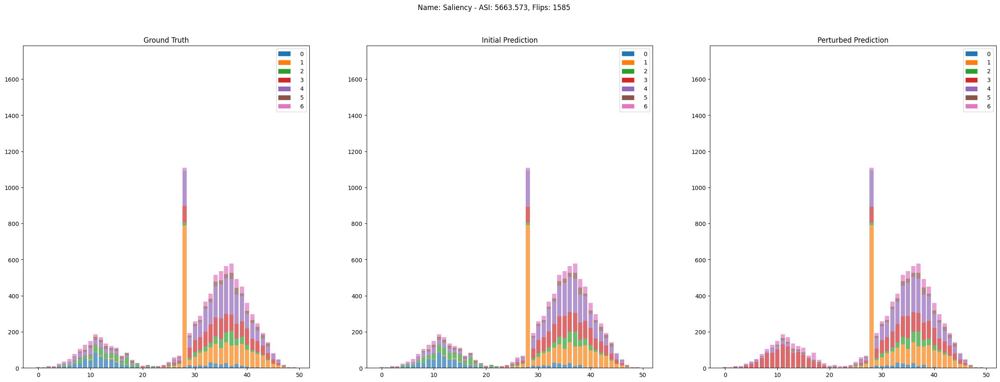

Name: GradientShap
ASI: 4306.950, Flips: 3956


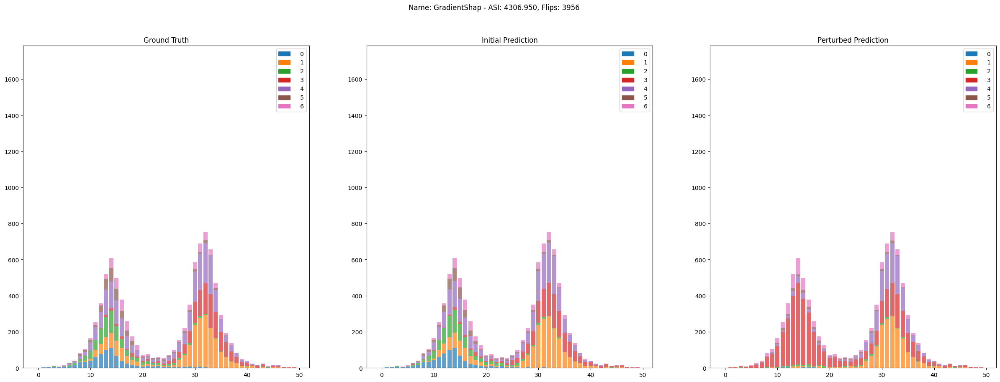

Name: DeepLift
ASI: 4576.400, Flips: 4407


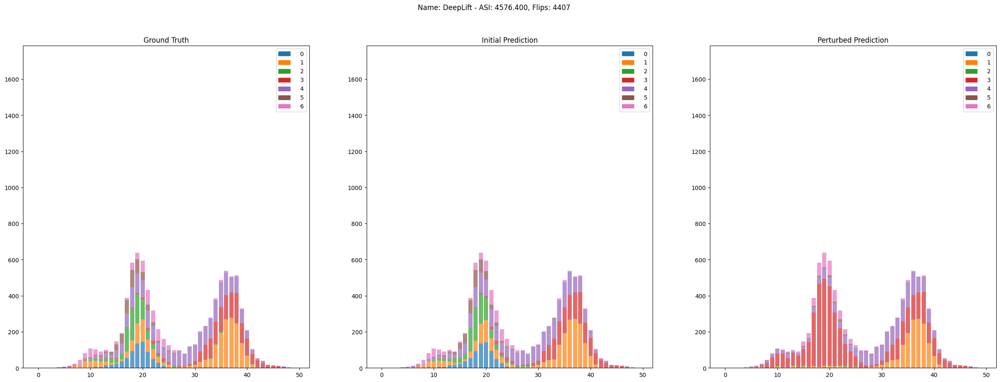

Name: DeepLiftShap
ASI: 4280.963, Flips: 4623


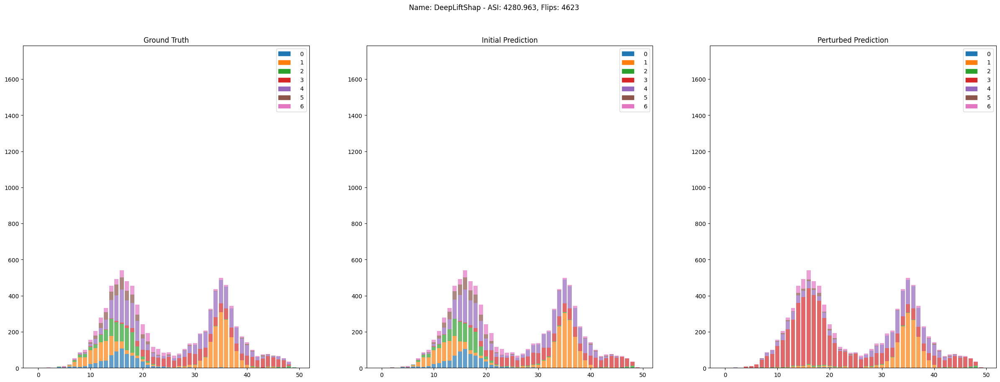

Name: IntegratedGradients
ASI: 4549.001, Flips: 4500


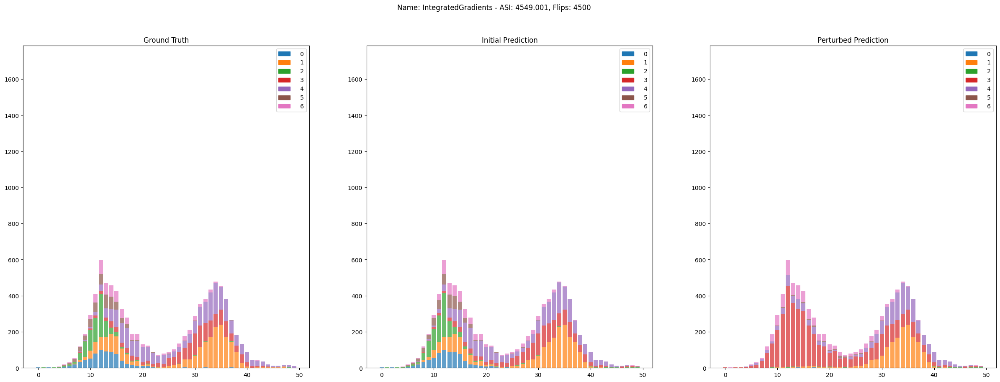

In [25]:
generate_histogram(ret_train)

Name: Saliency
ASI: 5663.573, Flips: 1585


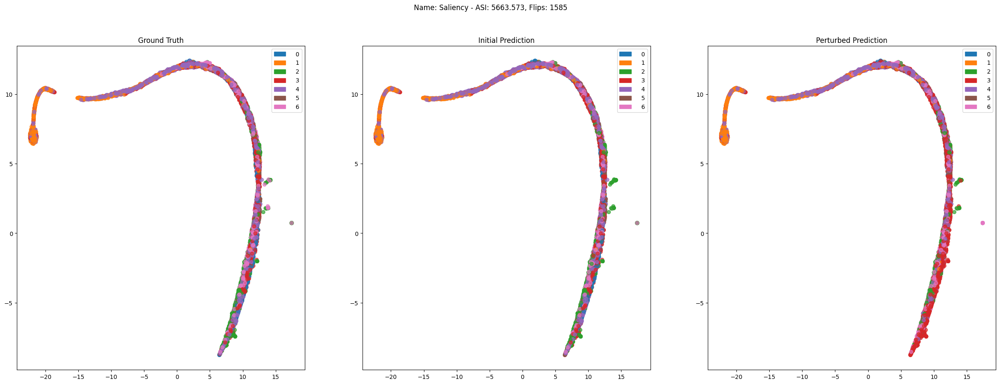

Name: GradientShap
ASI: 4306.950, Flips: 3956


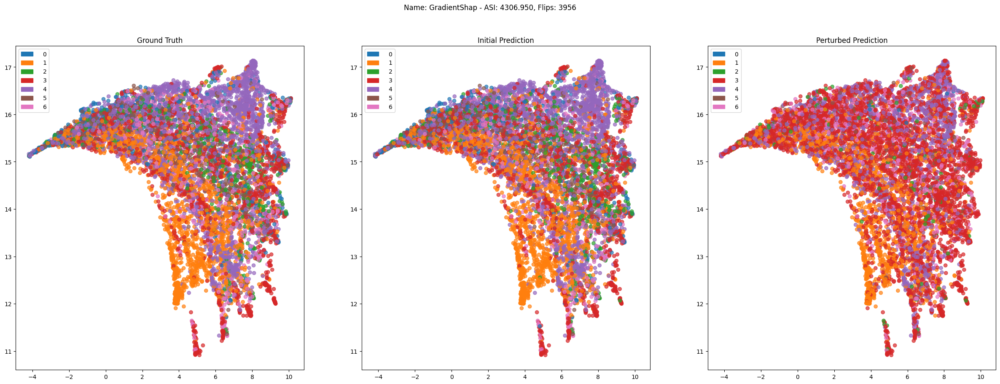

Name: DeepLift
ASI: 4576.400, Flips: 4407


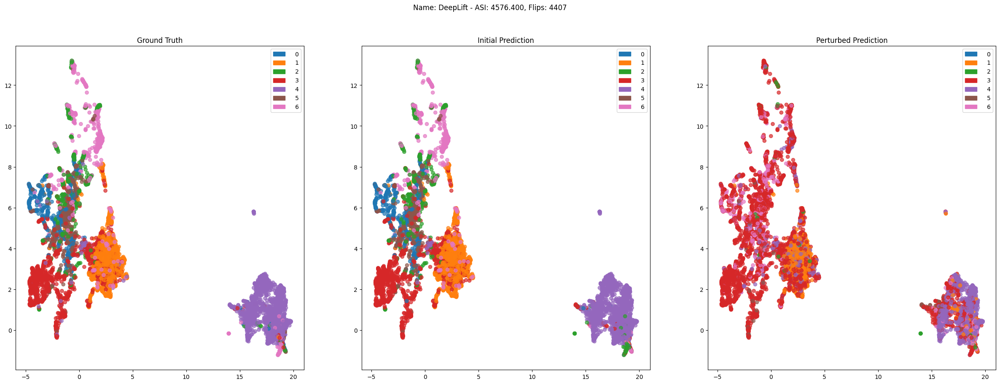

Name: DeepLiftShap
ASI: 4280.963, Flips: 4623


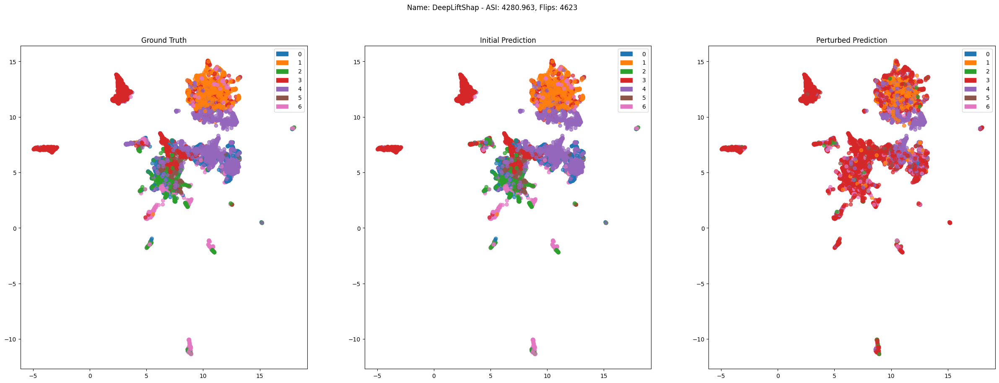

Name: IntegratedGradients
ASI: 4549.001, Flips: 4500


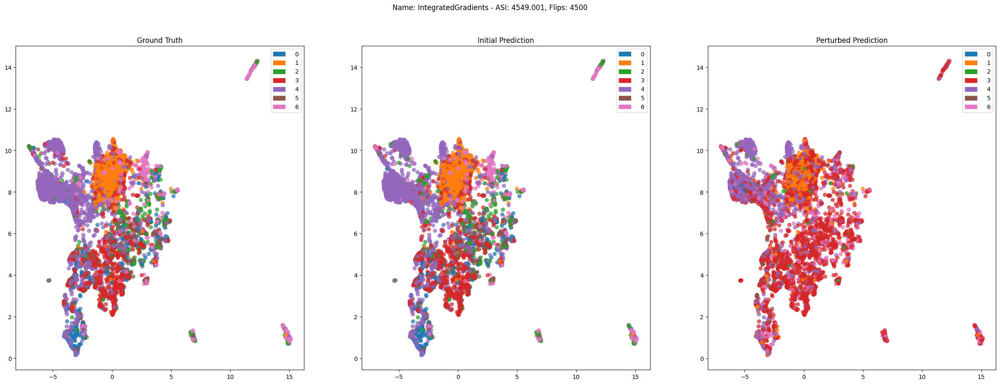

In [26]:
generate_projections(ret_train)

Name: Saliency
ASI: 4808.297, Flips: 1887


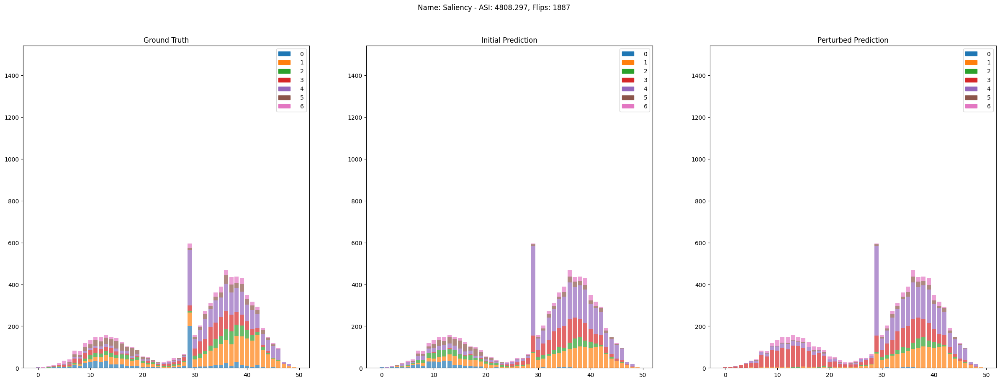

Name: GradientShap
ASI: 3656.601, Flips: 3739


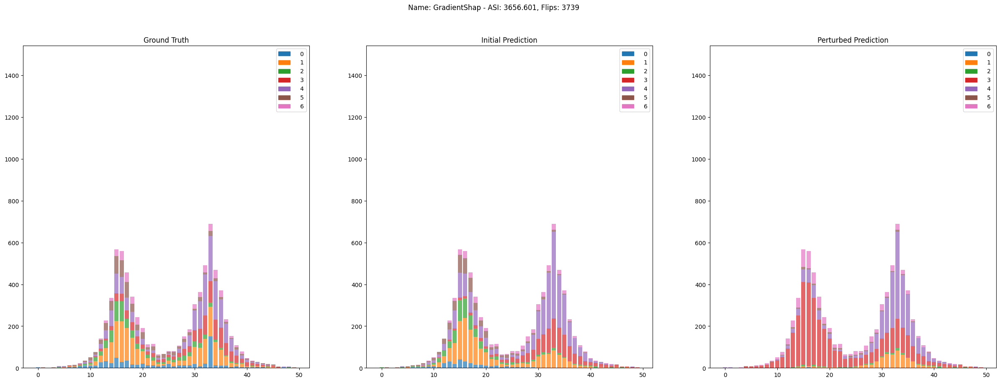

Name: DeepLift
ASI: 3777.914, Flips: 4080


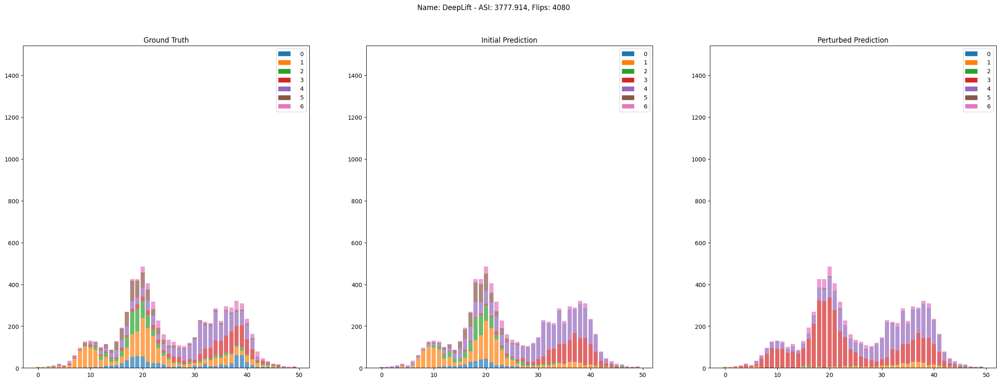

Name: DeepLiftShap
ASI: 3787.485, Flips: 4161


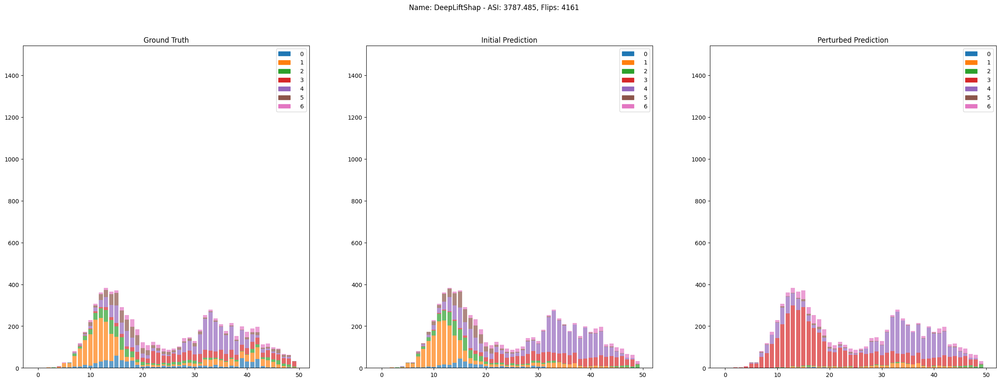

Name: IntegratedGradients
ASI: 4033.125, Flips: 3943


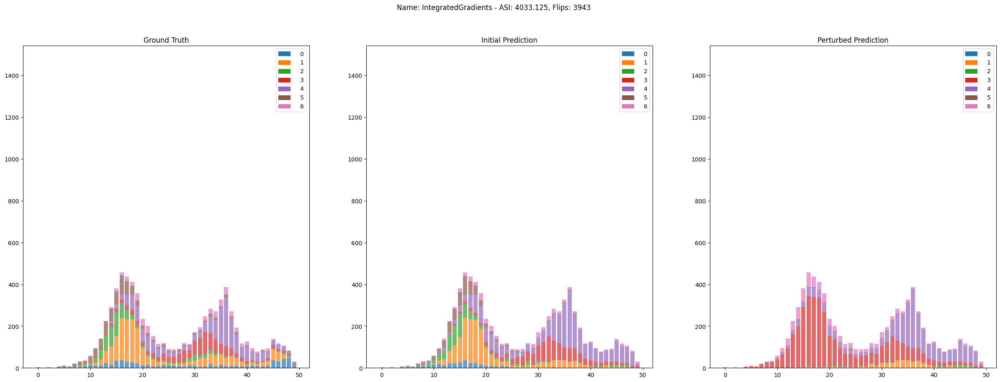

In [27]:
generate_histogram(ret_test)

Name: Saliency
ASI: 4808.297, Flips: 1887


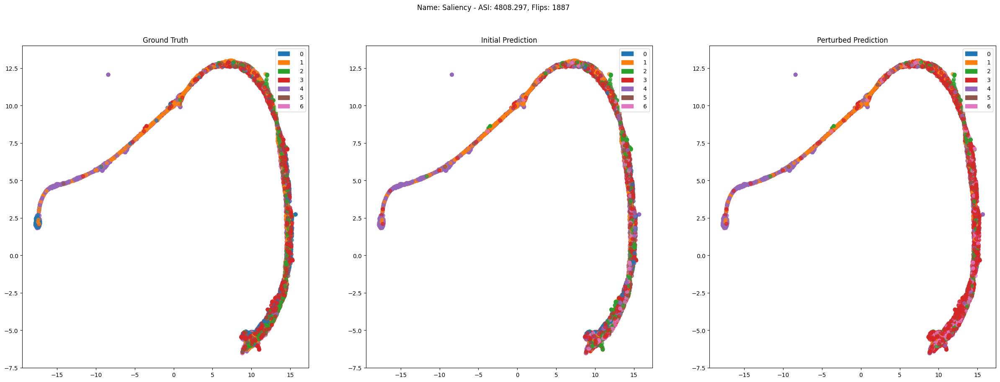

Name: GradientShap
ASI: 3656.601, Flips: 3739


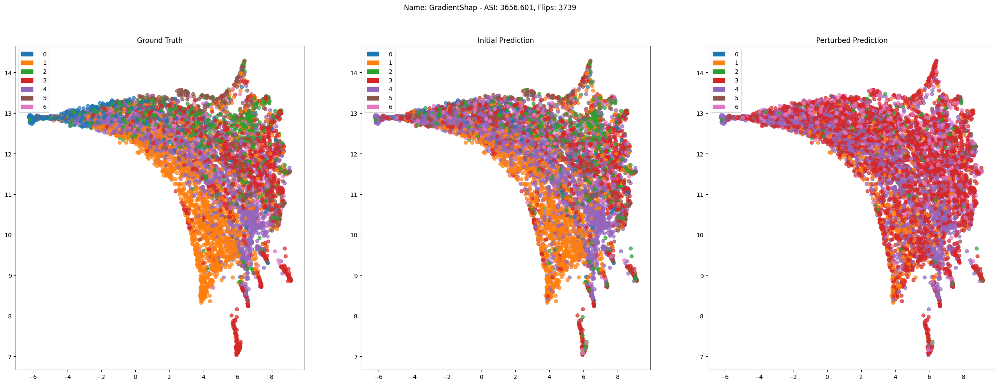

Name: DeepLift
ASI: 3777.914, Flips: 4080


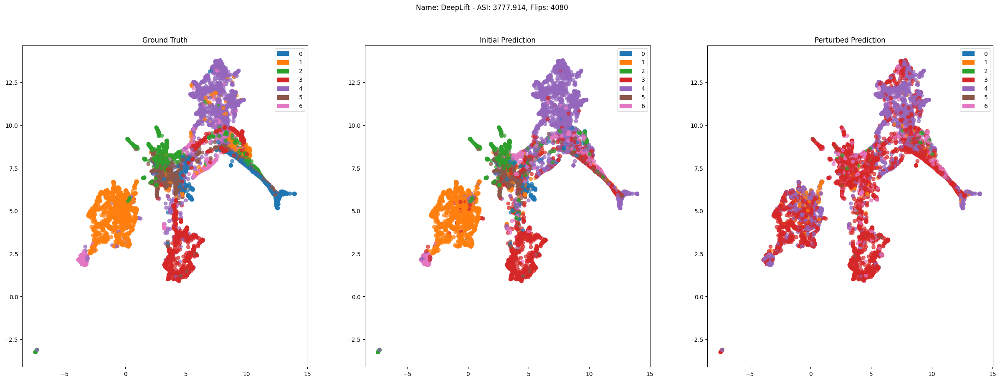

Name: DeepLiftShap
ASI: 3787.485, Flips: 4161


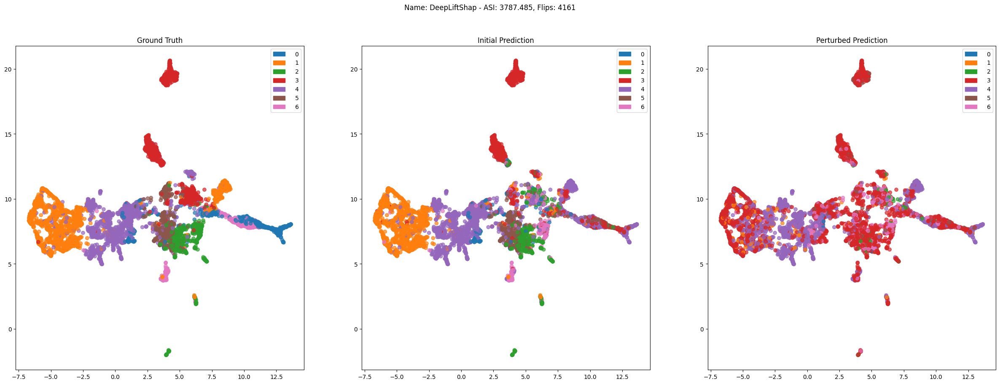

Name: IntegratedGradients
ASI: 4033.125, Flips: 3943


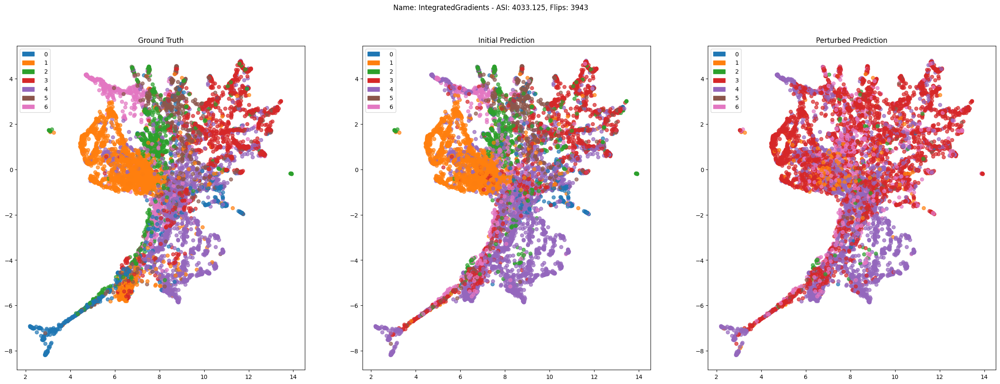

In [28]:
generate_projections(ret_test)

In [29]:
torch.save(model, 'models/electric-devices-cnn.pth')

In [30]:
loader = dataloader_train_not_shuffled
ret_train_w = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 1, 2], perturbation_fnc=exp_pa.delete_to_global_mean, seq_len=1)

  0%|          | 0/8926 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/attr/_core/deep_lift.py:304: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(
 72%|███████▏  | 6392/8926 [17:54<06:20,  6.66it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/scipy/spatial/distance.py:1300: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(js / 2.0)
100%|██████████| 8926/8926 [24:38<00:00,  6.04it/s]


In [31]:
loader = dataloader_test
ret_test_w = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 1, 2], perturbation_fnc=exp_pa.delete_to_global_mean, seq_len=1)

100%|██████████| 7711/7711 [20:35<00:00,  6.24it/s]


Name: Saliency
ASI: 5017.551, Flips: 1585, Accuracy before 0.9656, after 0.7998


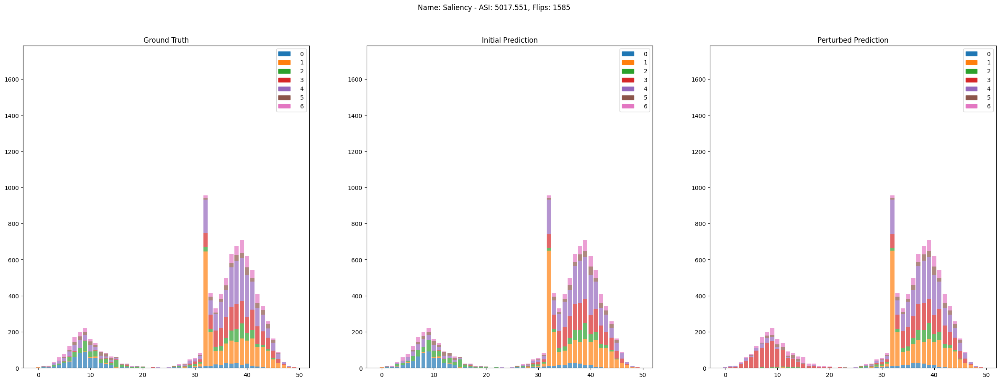

Name: GradientShap
ASI: 3882.826, Flips: 3927, Accuracy before 0.9656, after 0.5402


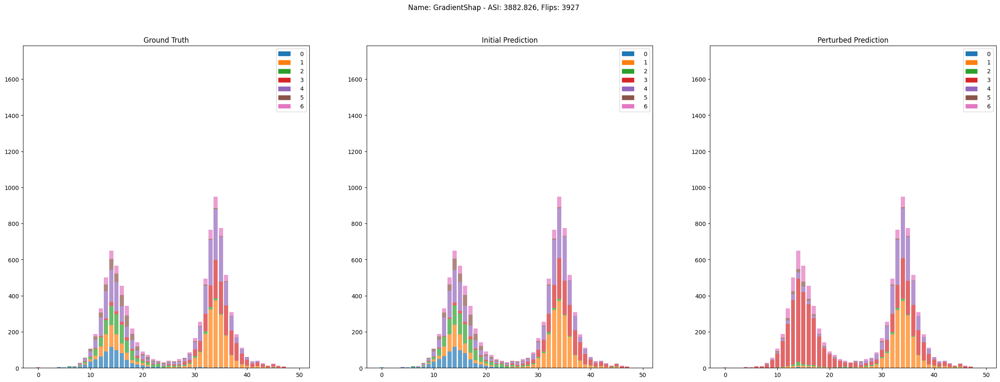

Name: DeepLift
ASI: 4052.130, Flips: 4407, Accuracy before 0.9656, after 0.4889


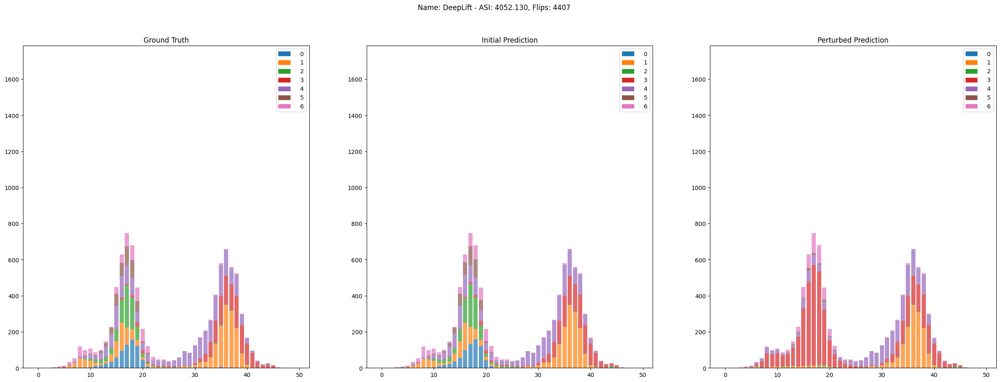

Name: DeepLiftShap
ASI: 3797.785, Flips: 4623, Accuracy before 0.9656, after 0.4603


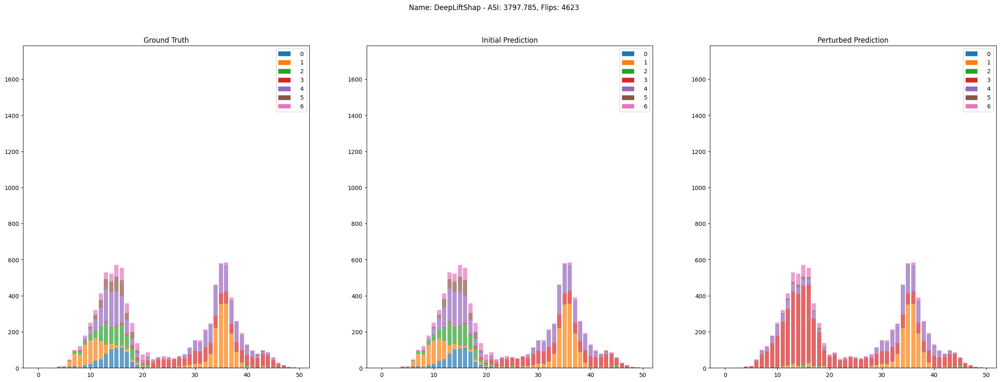

Name: IntegratedGradients
ASI: 4029.404, Flips: 4500, Accuracy before 0.9656, after 0.4737


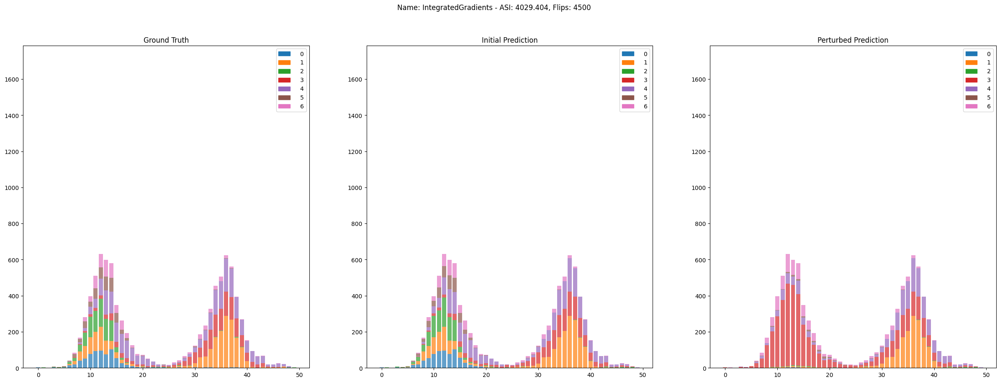

In [32]:
generate_histogram(ret_train_w)

Name: Saliency
ASI: 5017.551, Flips: 1585


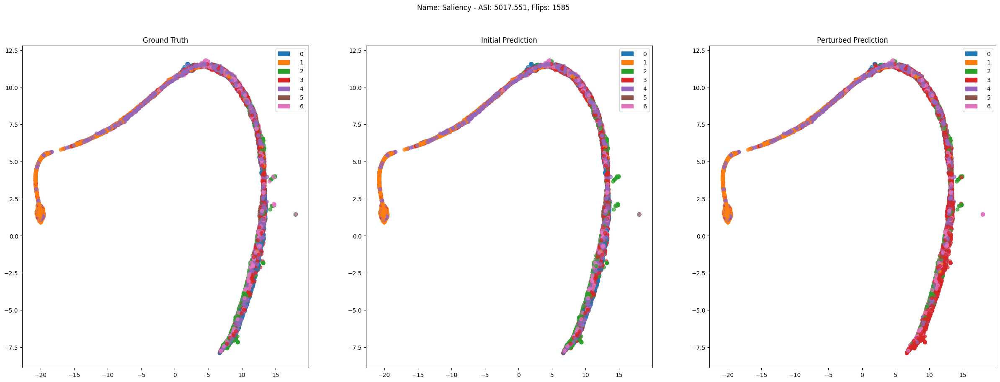

Name: GradientShap
ASI: 3882.826, Flips: 3927


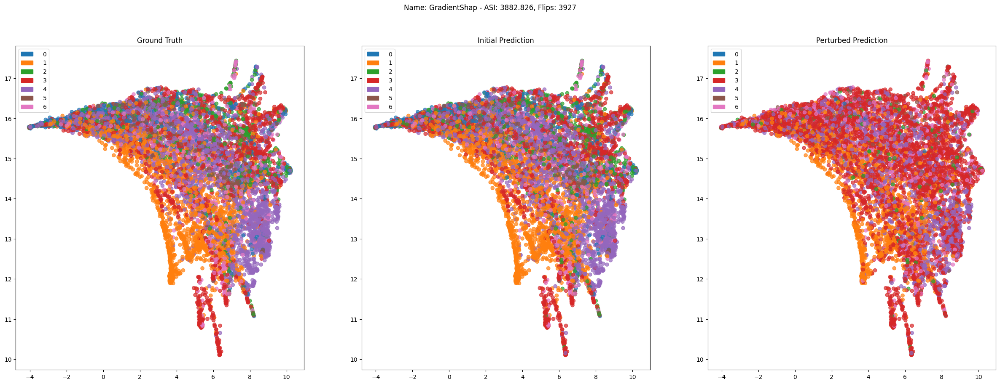

Name: DeepLift
ASI: 4052.130, Flips: 4407


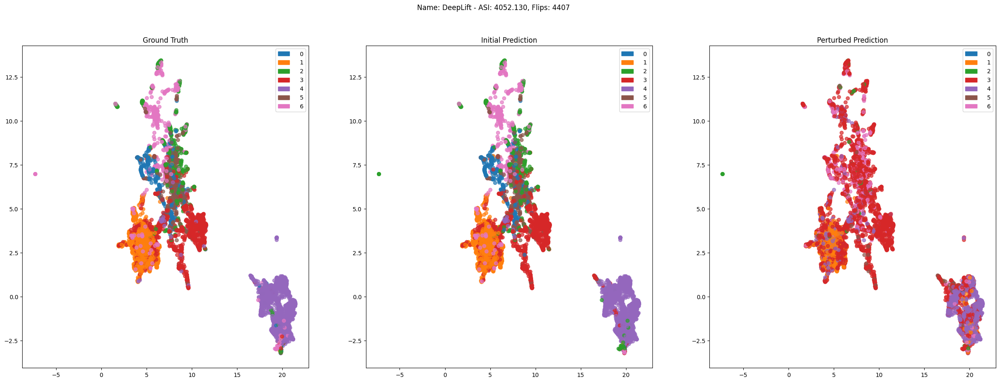

Name: DeepLiftShap
ASI: 3797.785, Flips: 4623


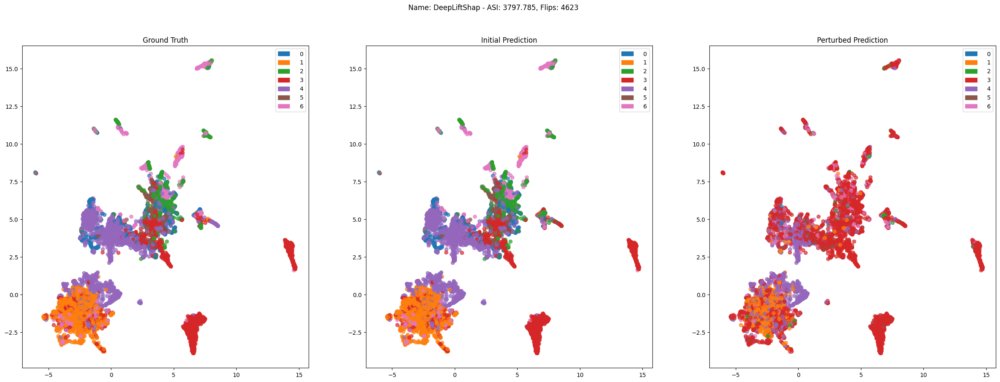

Name: IntegratedGradients
ASI: 4029.404, Flips: 4500


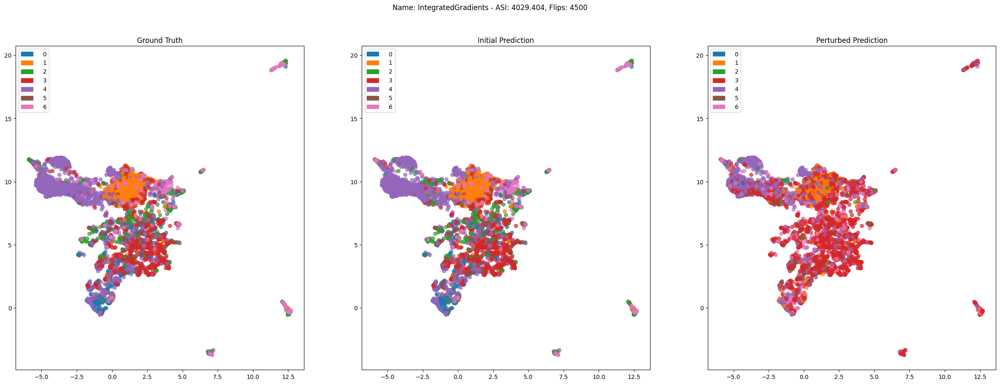

In [33]:
generate_projections(ret_train_w)

Name: Saliency
ASI: 4211.571, Flips: 1887, Accuracy before 0.7007, after 0.5753


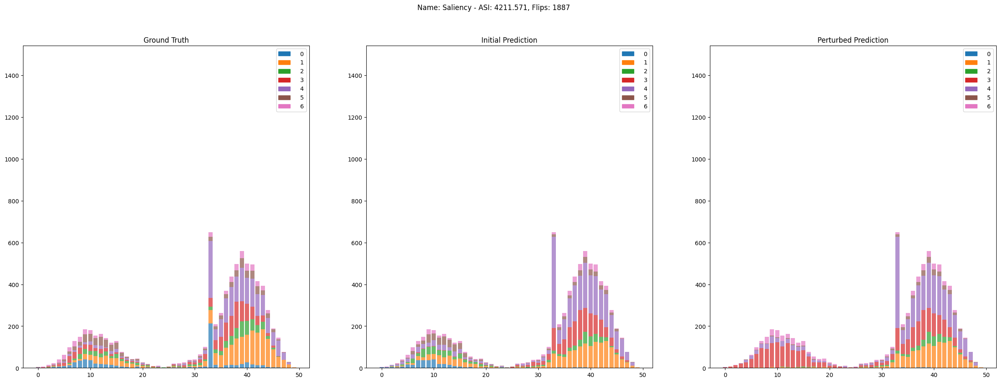

Name: GradientShap
ASI: 3250.946, Flips: 3736, Accuracy before 0.7007, after 0.3448


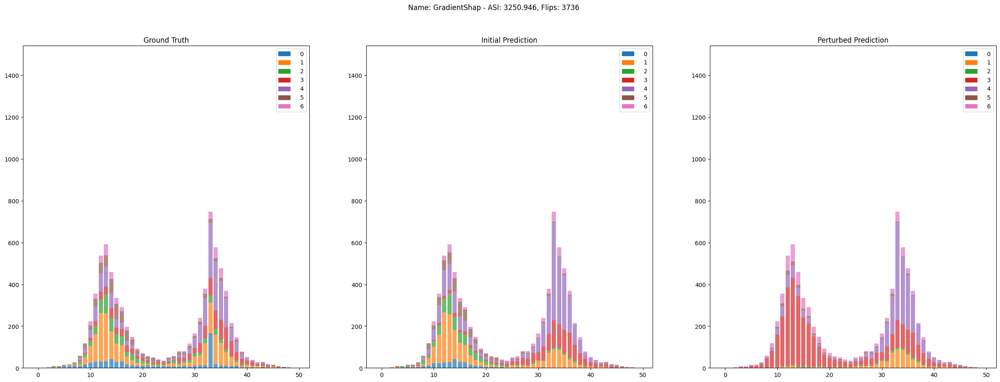

Name: DeepLift
ASI: 3320.549, Flips: 4080, Accuracy before 0.7007, after 0.3298


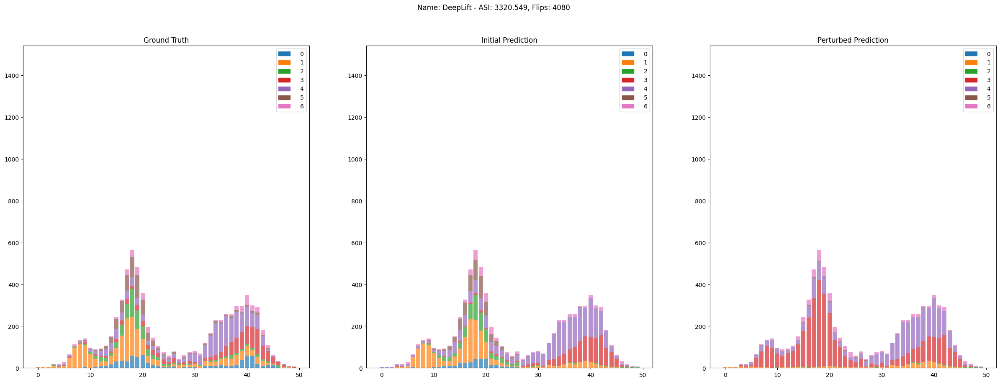

Name: DeepLiftShap
ASI: 3315.048, Flips: 4161, Accuracy before 0.7007, after 0.2979


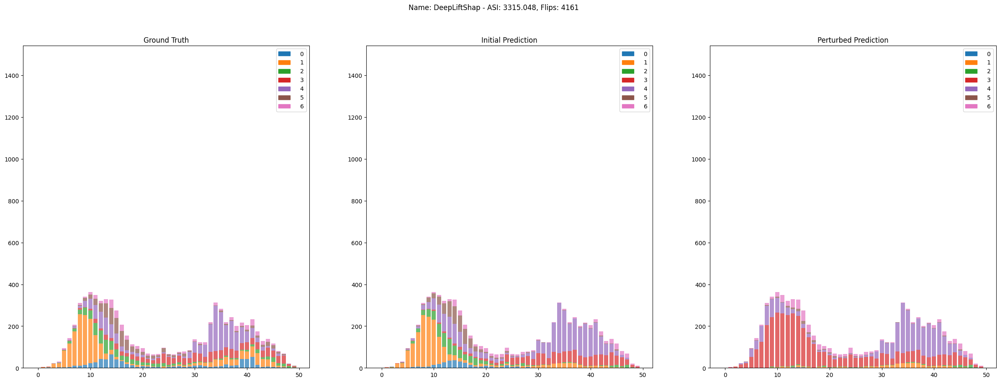

Name: IntegratedGradients
ASI: 3518.814, Flips: 3943, Accuracy before 0.7007, after 0.2921


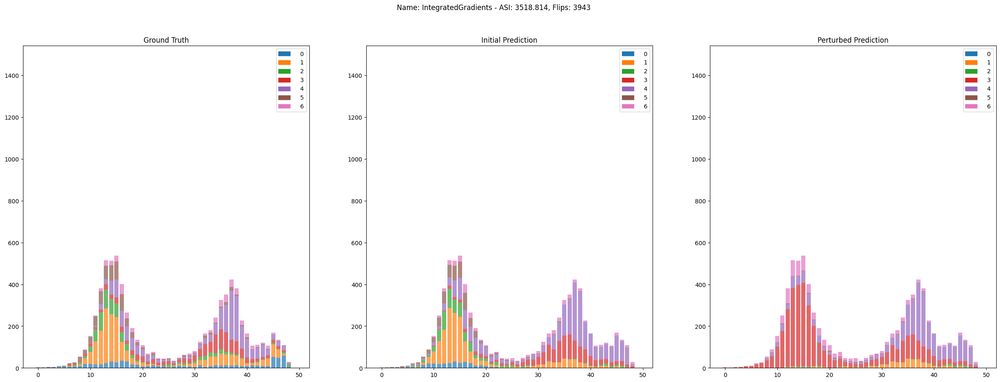

In [34]:
generate_histogram(ret_test_w)

Name: Saliency
ASI: 4211.571, Flips: 1887


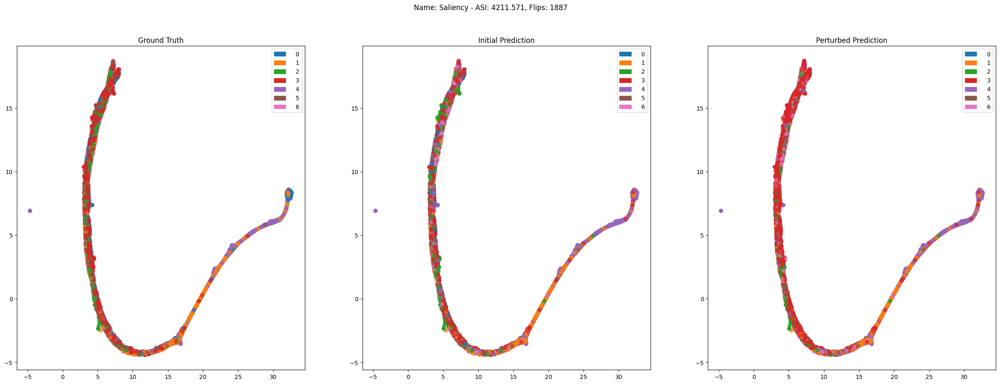

Name: GradientShap
ASI: 3250.946, Flips: 3736


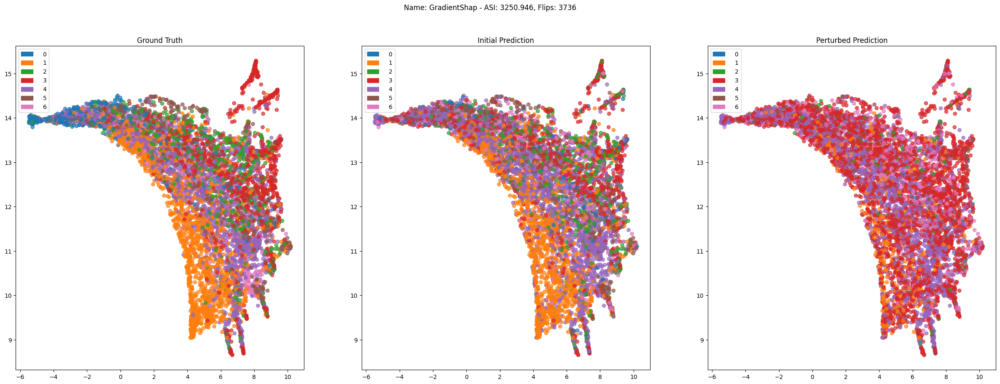

Name: DeepLift
ASI: 3320.549, Flips: 4080


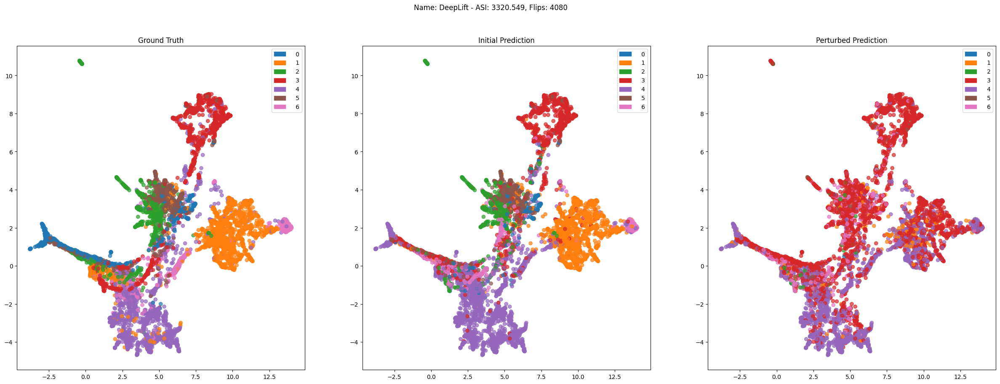

Name: DeepLiftShap
ASI: 3315.048, Flips: 4161


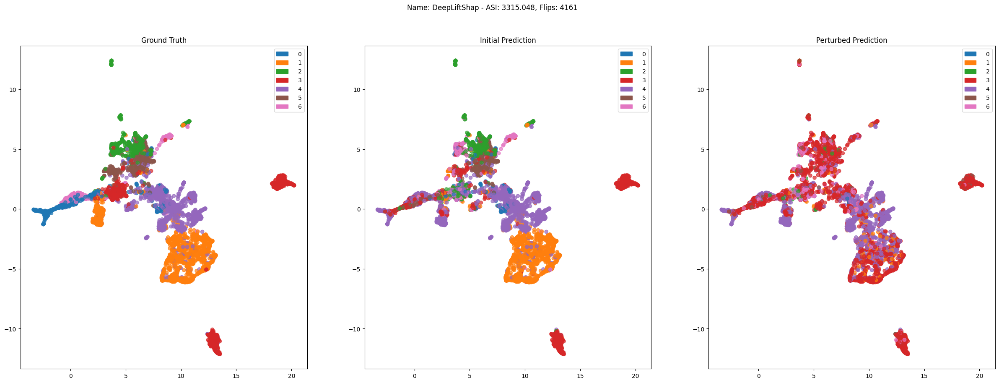

Name: IntegratedGradients
ASI: 3518.814, Flips: 3943


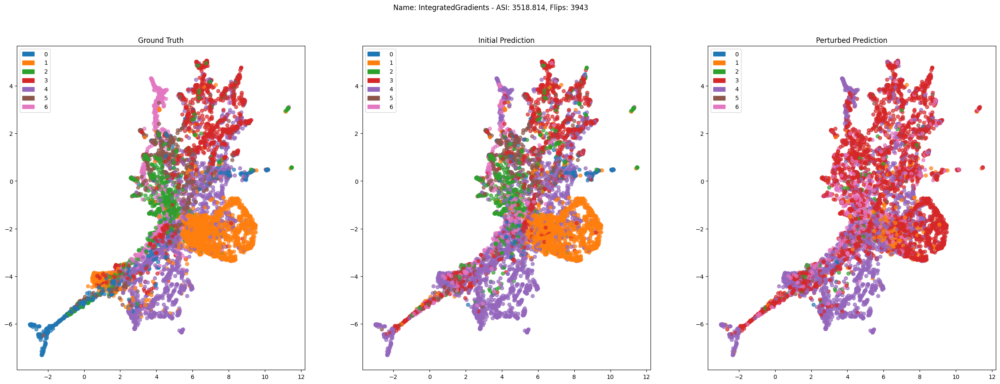

In [35]:
generate_projections(ret_test_w)